## Table of contents
* [Introduction: Business Problem](#Introduction)
* [Data](#Data)
* [Methodology](#Methodology)
* [Analysis](#Analysis)
* [Conclusion](#Conclusion)

### Introduction

##### This report is for commercial companies as well as State law enforcement on ways to reduce crime, provide internet accesses as well solve potential crimes. Suggestions provided in this study will provide recommendations on where to emplace wifi Camera systems that provide a free 5G Wifi service in New York City.  

##### Crime in select New York City neighborhoods has increased overtime despite efforts to Police the areas. What I would to illustrate is that there is a direct correlation to locations that offer free Wifi and reduced crime rates. While deciding the location to offer free wifi service there are several factors to consider. Below is the data required to explain the problem and recommendations on where to place more cameras. 

##### My business does not require a physical location to establish a company headquarters since we are providing a service. The service that I am providing has two(2) target audiences; law enforcement, and people looking for free data. Additionally, I will have ad services targeted to those individuals using the free wifi.

# Data

##### 1.) Locational data for all Wi-Fi access points in New York City. I will use this data to show that areas in New York City that have clusters of WiFi have lower crime rates. I will then use areas without WiFi to use as locations to install wifi 5G cameras 
##### 2.) Crime statistics for New York City. This data will be used to show where crime is higher than surrounding areas. 
##### 3.) New York City Neighborhood Names from Four Square. 

In [1]:
%matplotlib inline
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import calendar
import numpy as np
import requests
import folium
import json # library to handle JSON files
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

#### Import and read the Datafram with Pandas

In [2]:
NYC_crime = pd.read_csv('NYPD_Complaint_Data_Current__Year_To_Date_.csv')

In [27]:
NYC_crime.head()

,CMPLNT_NUM,ADDR_PCT_CD,BORO_NM,PD_DESC,PREM_TYP_DESC,RPT_DT,VIC_AGE_GROUP,VIC_RACE,X_COORD_CD,Y_COORD_CD,Latitude,Longitude,Lat_Lon
228904,255301253,49,BRONX,ASSAULT 3,RESIDENCE - APT. HOUSE,01/01/2018,25-44,BLACK HISPANIC,1024125.0,248360.0,40.848284,-73.855874,"(40.848284087, -73.855873511)"
228234,692632806,46,BRONX,"ASSAULT 2,1,UNCLASSIFIED",STREET,01/01/2018,18-24,BLACK HISPANIC,1011115.0,250178.0,40.853323,-73.902891,"(40.853323123, -73.902890744)"
228233,255048226,43,BRONX,"CRIMINAL MISCHIEF,UNCLASSIFIED 4",RESIDENCE - APT. HOUSE,01/01/2018,45-64,WHITE HISPANIC,1018624.0,241853.0,40.830447,-73.875790,"(40.830447407, -73.875790162)"
228232,197241049,28,MANHATTAN,"LARCENY,PETIT FROM STORE-SHOPL",CHAIN STORE,01/01/2018,UNKNOWN,UNKNOWN,998271.0,231591.0,40.802337,-73.949358,"(40.802336853, -73.949357635)"
228231,989440931,102,QUEENS,"TRESPASS 3, CRIMINAL",RESIDENCE-HOUSE,01/01/2018,UNKNOWN,UNKNOWN,1029888.0,191910.0,40.693316,-73.835427,"(40.693315938, -73.83542656)"


In [28]:
NYC_crime.sort_values('BORO_NM', inplace=True)

In [29]:
#NYC_crime.drop('CMPLNT_FR_DT','HADEVELOPT', 'HOUSING_PSA', axis=1, )

NYC_crime.drop(columns=['CMPLNT_FR_DT','CMPLNT_TO_TM','CMPLNT_FR_TM','CMPLNT_TO_DT',
                        'HADEVELOPT','VIC_SEX','CRM_ATPT_CPTD_CD','PATROL_BORO','PD_CD','STATION_NAME',
                        'LAW_CAT_CD','OFNS_DESC','PARKS_NM','KY_CD','LOC_OF_OCCUR_DESC','HOUSING_PSA',
                        'JURISDICTION_CODE','JURIS_DESC','SUSP_SEX','TRANSIT_DISTRICT'],inplace=True)

KeyError: "['CMPLNT_FR_DT' 'CMPLNT_TO_TM' 'CMPLNT_FR_TM' 'CMPLNT_TO_DT' 'HADEVELOPT'\n 'VIC_SEX' 'CRM_ATPT_CPTD_CD' 'PATROL_BORO' 'PD_CD' 'STATION_NAME'\n 'LAW_CAT_CD' 'OFNS_DESC' 'PARKS_NM' 'KY_CD' 'LOC_OF_OCCUR_DESC'\n 'HOUSING_PSA' 'JURISDICTION_CODE' 'JURIS_DESC' 'SUSP_SEX'\n 'TRANSIT_DISTRICT'] not found in axis"

In [32]:
#remove row where if there is any 'NaN' value in column 'A'
NYC_crime.head(100)

,CMPLNT_NUM,ADDR_PCT_CD,BORO_NM,PD_DESC,PREM_TYP_DESC,RPT_DT,VIC_AGE_GROUP,VIC_RACE,X_COORD_CD,Y_COORD_CD,Latitude,Longitude,Lat_Lon
228904,255301253,49,BRONX,ASSAULT 3,RESIDENCE - APT. HOUSE,01/01/2018,25-44,BLACK HISPANIC,1024125.0,248360.0,40.848284,-73.855874,"(40.848284087, -73.855873511)"
79833,945499584,46,BRONX,"CRIMINAL MISCHIEF,UNCLASSIFIED 4",RESIDENCE - APT. HOUSE,05/02/2018,25-44,WHITE HISPANIC,1012480.0,252484.0,40.859648,-73.897947,"(40.859648141, -73.897946881)"
176201,529481469,47,BRONX,AGGRAVATED HARASSMENT 2,RESIDENCE - PUBLIC HOUSING,02/13/2018,<18,WHITE HISPANIC,1021171.0,258135.0,40.875126,-73.866497,"(40.875126333, -73.866496863)"
79830,758812189,47,BRONX,"LARCENY,GRAND FROM VEHICLE/MOTORCYCLE",STREET,05/02/2018,25-44,BLACK,1020808.0,262493.0,40.887089,-73.867786,"(40.887089188, -73.867785667)"
176204,370788001,45,BRONX,"BURGLARY,RESIDENCE,DAY",RESIDENCE - APT. HOUSE,02/13/2018,25-44,AMER IND,1031842.0,244236.0,40.836927,-73.828010,"(40.836926711, -73.828009795)"
176205,829202990,47,BRONX,"LARCENY,PETIT FROM AUTO",STREET,02/13/2018,UNKNOWN,BLACK,1029802.0,259520.0,40.878887,-73.835278,"(40.878887402, -73.835278223)"
79829,911554056,44,BRONX,"HARASSMENT,SUBD 3,4,5",RESIDENCE - APT. HOUSE,05/02/2018,45-64,BLACK HISPANIC,1004809.0,243208.0,40.834209,-73.925707,"(40.834209452, -73.925706819)"
176207,113568632,44,BRONX,"MISCHIEF, CRIMINAL 4, OF MOTOR",STREET,02/13/2018,UNKNOWN,UNKNOWN,1006607.0,244473.0,40.837677,-73.919205,"(40.837677142, -73.919205124)"
176208,605482885,40,BRONX,"LARCENY,GRAND FROM PERSON,PURS",STREET,02/13/2018,18-24,BLACK,1005028.0,234516.0,40.810352,-73.924942,"(40.810351863, -73.924942326)"
79824,421033201,40,BRONX,AGGRAVATED HARASSMENT 2,RESIDENCE - APT. HOUSE,05/02/2018,<18,BLACK HISPANIC,1005041.0,234533.0,40.810398,-73.924895,"(40.810398494, -73.924895311)"


### Methodology 

##### SUMMARY: Looking at the outcome of the Heatmap, I can identify that there are two columns of information that have incomplete data.  Once this was identified, I decided to DROP these columns.

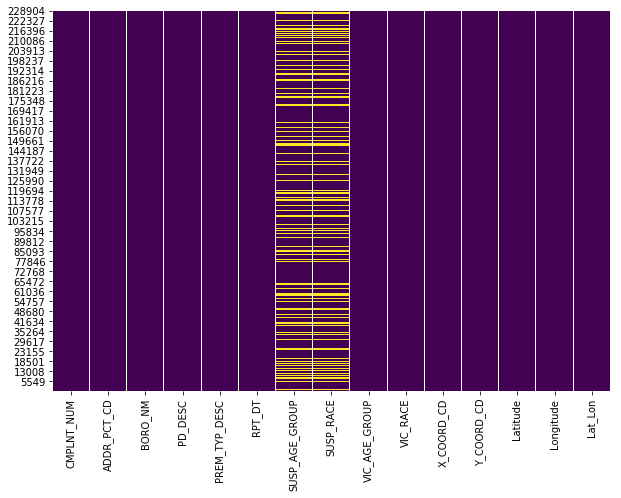

In [9]:
plt.figure(figsize=(10,7))
sns.heatmap(NYC_crime.isnull(), cbar = False, cmap = 'viridis')

In [10]:
# Drop the two (2) columns identified earlier.
NYC_crime.drop(columns=['SUSP_AGE_GROUP','SUSP_RACE'],inplace=True)

In [11]:
# Add the datframe for the WiFi locations in New York City
wifi = pd.read_csv('nyc-wi-fi-hotspot-locations.csv')
wifi.head(10)

,OBJECTID,Borough,Type,Provider,Name,Location,Latitude,Longitude,X,Y,...,NTAName,CounDist,Postcode,BoroCD,CT2010,BCTCB2010,BIN,BBL,DOITT_ID,"Location (Lat, Long)"
0,8641,QU,Free,Spot On Networks,QUEENS BRIDGE - JACOB A. RIIS Settlement House,10-25 41 AVENUE,40.755727,-73.944583,999603.226171,214613.274563,...,Queensbridge-Ravenswood-Long Island City,26.0,11101,401.0,25.0,4002500.0,4433386.0,4.004700e+09,4746,"{'longitude': '-73.944583', 'human_address': '..."
1,8642,QU,Free,Spot On Networks,QUEENS BRIDGE - JACOB A. RIIS Settlement House,10-43 41 AVENUE,40.755333,-73.944131,999728.543834,214469.807003,...,Queensbridge-Ravenswood-Long Island City,26.0,11101,401.0,25.0,4002500.0,4433386.0,4.004700e+09,4747,"{'longitude': '-73.944131', 'human_address': '..."
2,8643,QU,Free,Spot On Networks,QUEENS BRIDGE - JACOB A. RIIS Settlement House,10-05 41 AVENUE,40.755751,-73.945166,999441.701232,214621.916935,...,Queensbridge-Ravenswood-Long Island City,26.0,11101,401.0,25.0,4002500.0,4433386.0,4.004700e+09,4748,"{'longitude': '-73.945166', 'human_address': '..."
3,8644,QU,Free,Spot On Networks,QUEENS BRIDGE - JACOB A. RIIS Settlement House,10-05 41 AVENUE,40.755751,-73.945166,999441.701232,214621.916935,...,Queensbridge-Ravenswood-Long Island City,26.0,11101,401.0,25.0,4002500.0,4433386.0,4.004700e+09,4749,"{'longitude': '-73.945166', 'human_address': '..."
4,8645,QU,Free,Spot On Networks,QUEENS BRIDGE - JACOB A. RIIS Settlement House,10-05 41 AVENUE,40.755751,-73.945166,999441.701232,214621.916935,...,Queensbridge-Ravenswood-Long Island City,26.0,11101,401.0,25.0,4002500.0,4433386.0,4.004700e+09,4750,"{'longitude': '-73.945166', 'human_address': '..."
5,8646,QU,Free,Spot On Networks,QUEENS BRIDGE - JACOB A. RIIS Settlement House,10-05 41 AVENUE,40.755751,-73.945166,999441.701232,214621.916935,...,Queensbridge-Ravenswood-Long Island City,26.0,11101,401.0,25.0,4002500.0,4433386.0,4.004700e+09,4751,"{'longitude': '-73.945166', 'human_address': '..."
6,8647,QU,Free,Spot On Networks,QUEENS BRIDGE - JACOB A. RIIS Settlement House,10-05 41 AVENUE,40.755751,-73.945166,999441.701232,214621.916935,...,Queensbridge-Ravenswood-Long Island City,26.0,11101,401.0,25.0,4002500.0,4433386.0,4.004700e+09,4752,"{'longitude': '-73.945166', 'human_address': '..."
7,8648,QU,Free,Spot On Networks,QUEENS BRIDGE - JACOB A. RIIS Settlement House,10-06 41 AVENUE,40.755290,-73.945633,999312.423603,214453.878885,...,Queensbridge-Ravenswood-Long Island City,26.0,11101,401.0,25.0,4002500.0,4433386.0,4.004700e+09,4753,"{'longitude': '-73.945633', 'human_address': '..."
8,8649,QU,Free,Spot On Networks,QUEENS BRIDGE - JACOB A. RIIS Settlement House,10-06 41 AVENUE,40.755290,-73.945633,999312.423603,214453.878885,...,Queensbridge-Ravenswood-Long Island City,26.0,11101,401.0,25.0,4002500.0,4433386.0,4.004700e+09,4754,"{'longitude': '-73.945633', 'human_address': '..."
9,8650,QU,Free,Spot On Networks,QUEENS BRIDGE - JACOB A. RIIS Settlement House,41-15 VERNON BLVD,40.755636,-73.947657,998751.597297,214579.596481,...,Queensbridge-Ravenswood-Long Island City,26.0,11101,401.0,25.0,4002500.0,4433410.0,4.004650e+09,4755,"{'longitude': '-73.947657', 'human_address': '..."


In [12]:
wifi.drop(columns=['Type','Borough','Remarks', 'SSID','NTACode', 'BoroCode','Activated','Location_T','SourceID','Provider', 'NTAName','CounDist','BoroCD','CT2010','BCTCB2010', 'BIN','BBL','DOITT_ID'], inplace=True)

In [13]:
## Group the Wifi by SSID
wifi_locations = wifi.groupby('Location').first()

In [14]:
wifi_loc = wifi_locations.loc[:, ['Latitude', 'Longitude', 'BoroName','City']]

wifi_loc.head()

,Latitude,Longitude,BoroName,City
Location,,,,
(PICNIC AREA) INSIDE PARK EAST SIDE OF INDIAN LAKE,40.837539,-73.893658,Bronx,Bronx
(PICNIC AREA) INSIDE PARK WEST OF PLAYGROUND,40.837117,-73.893310,Bronx,Bronx
1 Av (L),40.730953,-73.981628,Manhattan,New York
1 Boerum Place,40.691860,-73.988721,Brooklyn,Brooklyn
1 Dekalb Ave.,40.690137,-73.983226,Brooklyn,Brooklyn


### PART 2a: Data exploration and Analysis

#### Exploring locations with the highest crime rates

In [15]:
#Location of Crimes
pd.value_counts(NYC_crime['BORO_NM'])

BROOKLYN         67489
MANHATTAN        56691
BRONX            50153
QUEENS           44137
STATEN ISLAND    10285
Name: BORO_NM, dtype: int64

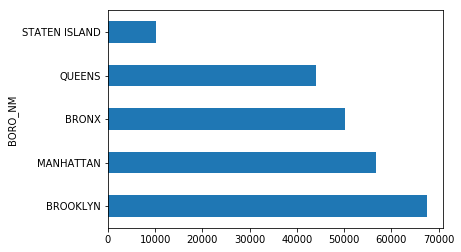

In [16]:
(     NYC_crime["BORO_NM"]
     .groupby(NYC_crime["BORO_NM"])
     .count()
     .sort_values(ascending=False)
     .plot(kind="barh")
)

In [17]:
#Types of Crime
pd.value_counts(NYC_crime['PD_DESC'])[:20]

HARASSMENT,SUBD 3,4,5               25321
ASSAULT 3                           21521
LARCENY,PETIT FROM STORE-SHOPL      15492
AGGRAVATED HARASSMENT 2              9752
LARCENY,PETIT FROM BUILDING,UN       9617
HARASSMENT,SUBD 1,CIVILIAN           9101
ASSAULT 2,1,UNCLASSIFIED             7548
MISCHIEF, CRIMINAL 4, OF MOTOR       6838
CRIMINAL MISCHIEF,UNCLASSIFIED 4     5961
CRIMINAL MISCHIEF 4TH, GRAFFIT       5572
LARCENY,PETIT FROM AUTO              5327
MARIJUANA, POSSESSION 4 & 5          3956
CRIMINAL CONTEMPT 1                  3939
LARCENY,PETIT FROM OPEN AREAS,       3715
MENACING,UNCLASSIFIED                3552
CONTROLLED SUBSTANCE, POSSESSI       2936
LEAVING SCENE-ACCIDENT-PERSONA       2621
INTOXICATED DRIVING,ALCOHOL          2612
FORGERY,ETC.,UNCLASSIFIED-FELO       2301
FRAUD,UNCLASSIFIED-FELONY            2170
Name: PD_DESC, dtype: int64

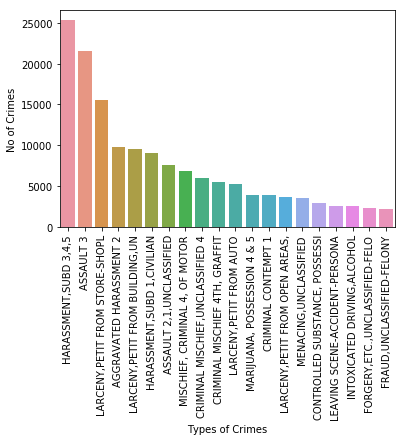

In [18]:
#Types of Crime Visualized
sns.countplot(x='PD_DESC',data=NYC_crime,order=NYC_crime['PD_DESC'].value_counts().index [:20])
plt.xticks(rotation='vertical')
plt.ylabel('No of Crimes')
plt.xlabel('Types of Crimes')
plt.show()

### Part 2b:Data Exploration of Wifi Locations

In [19]:
pd.value_counts(wifi_loc['City'])[:10]

New York            1545
Brooklyn             564
Queens               370
Bronx                294
Staten Island         73
Flushing               9
Long Island City       7
Jamaica                5
Corona                 3
Bayside                3
Name: City, dtype: int64

In [20]:
#locations = NYC.groupby('ADDR_PCT_CD').first()

#locations.head()

In [21]:
new_locations = NYC_crime.loc[:, ['PREM_TYP_DESC', 'PD_DESC','Latitude', 'Longitude']]

new_locations.shape

(228905, 4)

In [22]:
#Ensure to drop anyrows without reportable data
new_locations.dropna()

,PREM_TYP_DESC,PD_DESC,Latitude,Longitude
228904,RESIDENCE - APT. HOUSE,ASSAULT 3,40.848284,-73.855874
228234,STREET,"ASSAULT 2,1,UNCLASSIFIED",40.853323,-73.902891
228233,RESIDENCE - APT. HOUSE,"CRIMINAL MISCHIEF,UNCLASSIFIED 4",40.830447,-73.875790
228232,CHAIN STORE,"LARCENY,PETIT FROM STORE-SHOPL",40.802337,-73.949358
228231,RESIDENCE-HOUSE,"TRESPASS 3, CRIMINAL",40.693316,-73.835427
228230,RESIDENCE - APT. HOUSE,"HARASSMENT,SUBD 1,CIVILIAN",40.650540,-73.961102
228229,RESIDENCE - PUBLIC HOUSING,STRANGULATION 1ST,40.596347,-73.936763
228228,RESIDENCE - PUBLIC HOUSING,ASSAULT 3,40.596347,-73.936763
228227,RESIDENCE - APT. HOUSE,ASSAULT 3,40.847581,-73.902899
228226,RESIDENCE - APT. HOUSE,STRANGULATION 1ST,40.847581,-73.902899


### For this example, I limited the sample size to 1500 events

In [44]:
# get the first 2000 crimes in the dataframe until we have this finished
limit = 2000
df_incidents = new_locations.iloc[0:limit, :]

In [45]:
df_incidents.head()

,PREM_TYP_DESC,PD_DESC,Latitude,Longitude
228904,RESIDENCE - APT. HOUSE,ASSAULT 3,40.848284,-73.855874
228234,STREET,"ASSAULT 2,1,UNCLASSIFIED",40.853323,-73.902891
228233,RESIDENCE - APT. HOUSE,"CRIMINAL MISCHIEF,UNCLASSIFIED 4",40.830447,-73.875790
228232,CHAIN STORE,"LARCENY,PETIT FROM STORE-SHOPL",40.802337,-73.949358
228231,RESIDENCE-HOUSE,"TRESPASS 3, CRIMINAL",40.693316,-73.835427


### PART 3: Create the Map

In [46]:
NYC_crime_map = folium.Map(location=[40.730610, -73.935242],
                        zoom_start=12,
                        tiles="CartoDB dark_matter")

In [47]:
# instantiate a feature group for the incidents in the dataframe
incidents = folium.map.FeatureGroup()

# loop through the 2000 crimes and add each to the incidents feature group
for lat, lng, in zip(df_incidents.Latitude, df_incidents.Longitude):
    incidents.add_child(
        folium.features.CircleMarker(
            [lat, lng],
            radius=3, # define how big you want the circle markers to be
            color='red',
            fill=True,
            fill_color='red',
            fill_opacity=0.6
        )
    )
# add incidents to map
NYC_crime_map.add_child(incidents)

In [48]:
from folium import plugins

# let's start again with a clean copy of the map of San Francisco
NYC_crime_map = folium.Map(location=[40.730610, -73.935242],
                        zoom_start=10,
                        tiles="CartoDB dark_matter")

# instantiate a mark cluster object for the incidents in the dataframe
incidents = plugins.MarkerCluster().add_to(NYC_crime_map)

#Pop up Text Information
for i in range(len(df_incidents)):
    popup_text = """ PD_DESC : {}<br> """
    popup_text = popup_text.format(df_incidents.index[i],
                               df_incidents.iloc[i][1]
                               )

# loop through the dataframe and add each data point to the mark cluster
for lat, lng, label, in zip(df_incidents.Latitude, df_incidents.Longitude, df_incidents.PD_DESC):
    folium.Marker(
        location=[lat, lng],
        icon=None,
        popup=popup_text
    ).add_to(incidents)

In [49]:
# display map
NYC_crime_map

#### Add Wifi Locations

##### Now that we have our data plotted, we need to see where the closest Police Station is location in vicinity of high crime areas without Wifi.  Let's perform some basic explanatory data analysis and derive some additional info from our raw data. 

In [50]:
# instantiate a feature group for the incidents in the dataframe
wifi = folium.map.FeatureGroup()

# loop through the 100 crimes and add each to the incidents feature group
for lat, lng, in zip(wifi_loc.Latitude, wifi_loc.Longitude):
    wifi.add_child(
        folium.features.CircleMarker(
            [lat, lng],
            radius=.5, # define how big you want the circle markers to be
            color='blue',
            fill=True,
            fill_color='blue',
            fill_opacity=0.6
        )
    )

# add incidents to map
NYC_crime_map.add_child(wifi)

In [51]:
!wget -q -O 'newyork_data.json' https://cocl.us/new_york_dataset
print('Data downloaded!')

Data downloaded!


In [52]:
# First step in this process is to load the JSON file with neighborhood information
with open('newyork_data.json') as json_data:
    newyork_data = json.load(json_data)

In [53]:
# define the dataframe columns
# this is how you create an empty frame to import data into
column_names = ['Borough', 'Neighborhood', 'Latitude', 'Longitude'] 

# instantiate the dataframe
neighborhoods = pd.DataFrame(columns=column_names)

In [54]:
neighborhoods_data = newyork_data['features']

In [55]:

# define the dataframe columns
# this is how you create an empty frame to import data into
column_names = ['Borough', 'Neighborhood', 'Latitude', 'Longitude'] 

# instantiate the dataframe
neighborhoods = pd.DataFrame(columns=column_names)

In [56]:
# you call on the raw data from the JSON file first
for data in neighborhoods_data:
    borough = neighborhood_name = data['properties']['borough'] 
    neighborhood_name = data['properties']['name']
        
    neighborhood_latlon = data['geometry']['coordinates']
    neighborhood_lat = neighborhood_latlon[1]
    neighborhood_lon = neighborhood_latlon[0]
    
    neighborhoods = neighborhoods.append({'Borough': borough,
                                          'Neighborhood': neighborhood_name,
                                          'Latitude': neighborhood_lat,
                                          'Longitude': neighborhood_lon}, ignore_index=True)

In [57]:
neighborhoods.head()

,Borough,Neighborhood,Latitude,Longitude
0,Bronx,Wakefield,40.894705,-73.847201
1,Bronx,Co-op City,40.874294,-73.829939
2,Bronx,Eastchester,40.887556,-73.827806
3,Bronx,Fieldston,40.895437,-73.905643
4,Bronx,Riverdale,40.890834,-73.912585


### Create map of New York using latitude and longitude values

In [58]:
NewYork_hood = folium.map.FeatureGroup()

for lat, lng, borough, neighborhood in zip(neighborhoods['Latitude'], neighborhoods['Longitude'], neighborhoods['Borough'], neighborhoods['Neighborhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=.1,
        popup=label,
        color='red',
        fill=False,
        parse_html=False).add_to(NYC_crime_map)  
    
# add incidents to map
NYC_crime_map.add_child(NewYork_hood)

### Insert Four Square Credentials

In [59]:
# The code was removed by Watson Studio for sharing.

Your credentails:


In [60]:
bronx_data = neighborhoods[neighborhoods['Borough'].str.contains ('Bronx')].reset_index(drop=True)
bronx_data.head()

,Borough,Neighborhood,Latitude,Longitude
0,Bronx,Wakefield,40.894705,-73.847201
1,Bronx,Co-op City,40.874294,-73.829939
2,Bronx,Eastchester,40.887556,-73.827806
3,Bronx,Fieldston,40.895437,-73.905643
4,Bronx,Riverdale,40.890834,-73.912585


In [61]:
bronx_latitude = bronx_data.loc[1, 'Latitude'] # neighborhood latitude value
bronx_longitude = bronx_data.loc[1, 'Longitude'] # neighborhood longitude value

bronx_name = bronx_data.loc[1, 'Neighborhood'] # neighborhood name

print('Latitude and longitude values of {} are {}, {}.'.format(bronx_name, 
                                                               bronx_latitude, 
                                                               bronx_longitude))

Latitude and longitude values of Co-op City are 40.87429419303012, -73.82993910812398.


In [62]:
police_search = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    bronx_latitude, 
    bronx_longitude, 
    radius,
    LIMIT
)
police_search

'https://api.foursquare.com/v2/venues/explore?&client_id=TZW5ORPBXWPVLVPRGTZS3OUNAGGACMP3DRSRNZHDKX3RGYQR&client_secret=ZEY0BP2QWIVAO2NMCYFYWWR4YZPZLJKIWP4KQGQCP4M5VBZW&v=20190210&ll=40.87429419303012,-73.82993910812398&radius=1000&limit=500'

In [63]:
results = requests.get(police_search).json()
results

{'meta': {'code': 200, 'requestId': '5c6da7584c1f6762f71f0980'},
 'response': {'suggestedFilters': {'header': 'Tap to show:',
   'filters': [{'name': 'Open now', 'key': 'openNow'},
    {'name': '$-$$$$', 'key': 'price'}]},
  'headerLocation': 'Co-Op City',
  'headerFullLocation': 'Co-Op City, Bronx',
  'headerLocationGranularity': 'neighborhood',
  'totalResults': 72,
  'suggestedBounds': {'ne': {'lat': 40.88329420203013,
    'lng': -73.81805887418497},
   'sw': {'lat': 40.865294184030105, 'lng': -73.84181934206299}},
  'groups': [{'type': 'Recommended Places',
    'name': 'recommended',
    'items': [{'reasons': {'count': 0,
       'items': [{'summary': 'This spot is popular',
         'type': 'general',
         'reasonName': 'globalInteractionReason'}]},
      'venue': {'id': '524b6ca6498e92aa03e03ff4',
       'name': 'Dumplin Shop',
       'location': {'address': '1530 E 222nd St',
        'lat': 40.876042191838856,
        'lng': -73.83595004760689,
        'labeledLatLngs': [{'la

In [64]:
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

In [65]:
venues = results['response']['groups'][0]['items']
    
nearby_venues = json_normalize(venues) # flatten JSON

# filter columns
filtered_columns = ['venue.name', 'venue.categories', 'venue.location.lat', 'venue.location.lng']
nearby_venues =nearby_venues.loc[:, filtered_columns]

# filter the category for each row
nearby_venues['venue.categories'] = nearby_venues.apply(get_category_type, axis=1)

# clean columns
nearby_venues.columns = [col.split(".")[-1] for col in nearby_venues.columns]

nearby_venues.shape

(72, 4)

In [66]:
nearby_venues.head(10)

,name,categories,lat,lng
0,Dumplin Shop,Dumpling Restaurant,40.876042,-73.835950
1,Red Lobster,Seafood Restaurant,40.869059,-73.826987
2,Panera Bread,Bakery,40.867866,-73.827845
3,Country Thyme Cuisine,Caribbean Restaurant,40.876880,-73.837734
4,Stop & Shop,Supermarket,40.868718,-73.825421
5,The Cookie Factory,Bakery,40.876461,-73.839353
6,Dollar Tree,Discount Store,40.870125,-73.828989
7,Bay Plaza Shopping Center,Shopping Mall,40.867410,-73.826654
8,DSW,Shoe Store,40.867804,-73.826727
9,Dallas BBQ,BBQ Joint,40.867956,-73.825300


In [67]:
nearby_venues.groupby('categories').count()

,name,lat,lng
categories,,,
Accessories Store,2,2,2
American Restaurant,1,1,1
Auto Garage,1,1,1
BBQ Joint,1,1,1
Bagel Shop,1,1,1
Bakery,2,2,2
Bank,1,1,1
Buffet,1,1,1
Bus Station,1,1,1


In [68]:
print('There are {} uniques categories.'.format(len(nearby_venues['categories'].unique())))

There are 47 uniques categories.


In [69]:
# one hot encoding
bronx_onehot = pd.get_dummies(nearby_venues[['categories']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
#bronx_onehot['Neighborhood'] = nearby_venues['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [bronx_onehot.columns[-1]] + list(bronx_onehot.columns[:-1])
bronx_onehot = bronx_onehot[fixed_columns]

bronx_onehot.head(10)

,Video Game Store,Accessories Store,American Restaurant,Auto Garage,BBQ Joint,Bagel Shop,Bakery,Bank,Buffet,Bus Station,...,Park,Pharmacy,Pizza Place,Restaurant,Sandwich Place,Seafood Restaurant,Shoe Store,Shopping Mall,Sporting Goods Shop,Supermarket
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
2,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
5,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
9,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


### Conclusion

Purpose of this project was to identify areas in New York that have a high crime rate.  In doing so, we found that areas within the Bronx were higher than surrounding areas.  Additionally, I wanted to see the availability of free wifi in these areas to see if this service was already being provided.  Lastly, I wanted to query the Foursquare data to determine if there police stations or government buildings in this location.  Analysis of the Bronx identified 

Final decission on optimal restaurant location will be made by stakeholders based on specific characteristics of neighborhoods and locations in every recommended zone, taking into consideration additional factors like attractiveness of each location (proximity to park or water), levels of noise / proximity to major roads, real estate availability, prices, social and economic dynamics of every neighborhood etc.